In [1]:
import numpy as np 
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.float_format', lambda x: '%.3f' % x)
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/widsdatathon2022/train.csv
/kaggle/input/widsdatathon2022/test.csv
/kaggle/input/widsdatathon2022/sample_solution.csv


# <b>1 <span style='color:#DC143C'>|</span> ABOUT THE ANALYSIS</b>

The aim of this analysis is to perform the exploratory analysis of train dataset and get some insights on how each of the variables relate to our target variable which is 'site_eui' (Site Energy Usage Intensity-the amount of heat and electricity consumed by a building). We have about 64 attributes(including the target). 

In [2]:
wids_train = pd.read_csv('/kaggle/input/widsdatathon2022/train.csv')
wids_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75757 entries, 0 to 75756
Data columns (total 64 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Year_Factor                75757 non-null  int64  
 1   State_Factor               75757 non-null  object 
 2   building_class             75757 non-null  object 
 3   facility_type              75757 non-null  object 
 4   floor_area                 75757 non-null  float64
 5   year_built                 73920 non-null  float64
 6   energy_star_rating         49048 non-null  float64
 7   ELEVATION                  75757 non-null  float64
 8   january_min_temp           75757 non-null  int64  
 9   january_avg_temp           75757 non-null  float64
 10  january_max_temp           75757 non-null  int64  
 11  february_min_temp          75757 non-null  int64  
 12  february_avg_temp          75757 non-null  float64
 13  february_max_temp          75757 non-null  int

# <b>2 <span style='color:#DC143C'>|</span> EDA</b>

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> Year Factor:</b></p>
</div>

Observations:

> 1. The year in which the observations are made. 
> 2. Most of the data belong to year 6
> 3. The median site energy usage intensity remains same for all years
> 4. There are a lot of outliers present beyond 200 site_eui
> 5. There is just one year in the test set which we need to predict.

Text(0.5, 1.02, 'Percent of data belonging to each year in the train set')

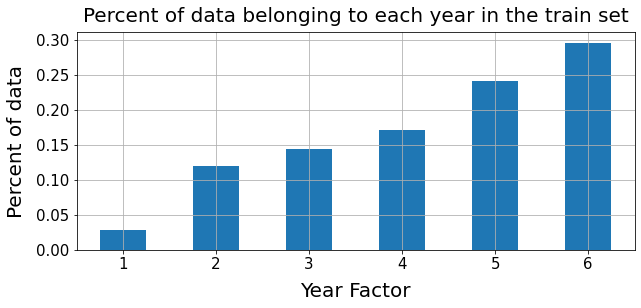

In [3]:
# plot
wids_train['Year_Factor'].value_counts(normalize = True).sort_values().plot(kind='bar', figsize=(10,4), rot=0)

plt.xlabel("Year Factor", labelpad=10, fontsize=20)
plt.ylabel("Percent of data", labelpad=10, fontsize=20)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title("Percent of data belonging to each year in the train set", y=1.02, fontsize=20)

Text(0.5, 1.02, 'Percent of data belonging to each year in the test set')

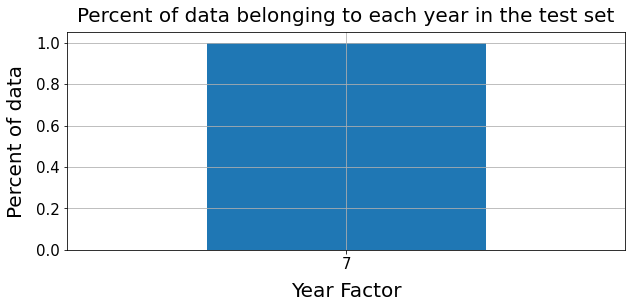

In [4]:
wids_test = pd.read_csv('/kaggle/input/widsdatathon2022/test.csv')
# plot
wids_test['Year_Factor'].value_counts(normalize = True).sort_values().plot(kind='bar', figsize=(10,4), rot=0)

plt.xlabel("Year Factor", labelpad=10, fontsize=20)
plt.ylabel("Percent of data", labelpad=10, fontsize=20)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title("Percent of data belonging to each year in the test set", y=1.02, fontsize=20)

Text(0.5, 1.02, 'Year wise site eui')

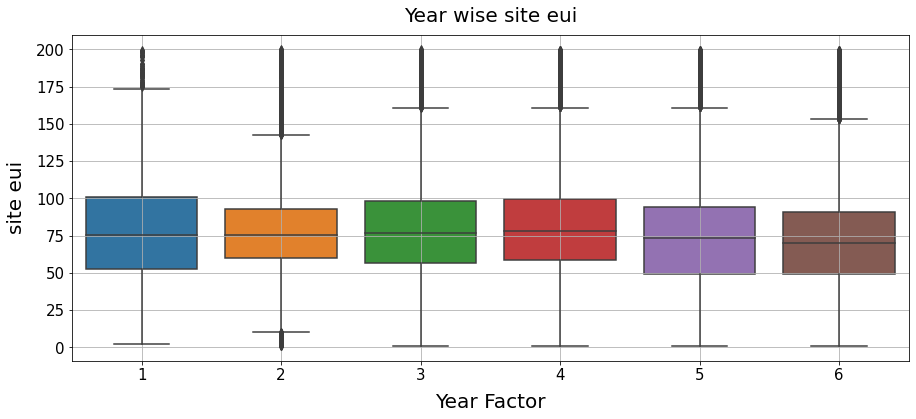

In [5]:
plt.figure(figsize = (15,6))
df = wids_train[wids_train['site_eui'] <= 200]
sns.boxplot(x = df['Year_Factor'], y= df['site_eui'])
plt.xlabel("Year Factor", labelpad=10, fontsize=20)
plt.ylabel("site eui", labelpad=10, fontsize=20)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title("Year wise site eui", y=1.02, fontsize=20)

In [6]:
fig = px.histogram(wids_train, x='site_eui', color='Year_Factor')
fig.update_layout(title_text='Year wise distribution of site energy usage', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> State Factor:</b></p>
</div>

Observations:

> 1. There are 7 unique states
> 2. State 6 has most data
> 3. The median site_eui for state 4 and state 6 is the highest among other states

Text(0.5, 1.02, 'Percent of data belonging to each state')

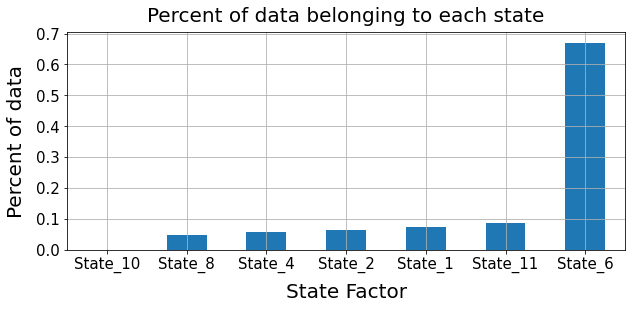

In [7]:
# plot
wids_train['State_Factor'].value_counts(normalize = True).sort_values().plot(kind='bar', figsize=(10,4), rot=0)

plt.xlabel("State Factor", labelpad=10, fontsize=20)
plt.ylabel("Percent of data", labelpad=10, fontsize=20)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title("Percent of data belonging to each state", y=1.02, fontsize=20)

Text(0.5, 1.02, 'State wise site eui')

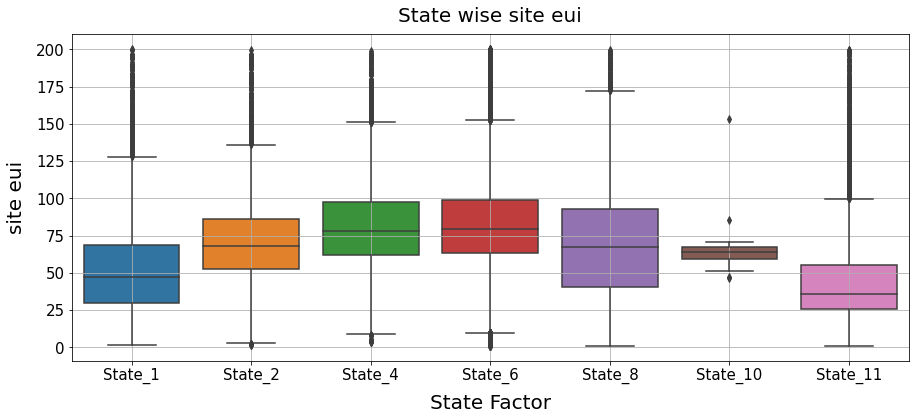

In [8]:
plt.figure(figsize = (15,6))
df = wids_train[wids_train['site_eui'] <= 200]
sns.boxplot(x = df['State_Factor'], y= df['site_eui'])
plt.xlabel("State Factor", labelpad=10, fontsize=20)
plt.ylabel("site eui", labelpad=10, fontsize=20)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title("State wise site eui", y=1.02, fontsize=20)

In [9]:
fig = px.histogram(wids_train, x='site_eui', color='State_Factor')
fig.update_layout(title_text='State wise distribution of site energy usage', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> Building Class:</b></p>
</div>

Observation:

>1. The median site eui is slightly looks about same for residential buildings as compared to the commercial buildings
>2. We need to further investigate the facility type for some clairty

Text(0.5, 1.02, 'Building type wise site eui')

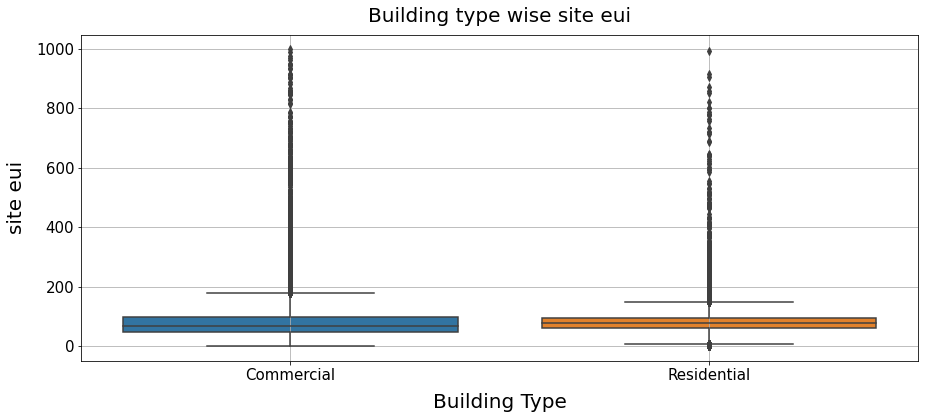

In [10]:
plt.figure(figsize = (15,6))
sns.boxplot(x = wids_train['building_class'], y= wids_train['site_eui'])
plt.xlabel("Building Type", labelpad=10, fontsize=20)
plt.ylabel("site eui", labelpad=10, fontsize=20)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title("Building type wise site eui", y=1.02, fontsize=20)

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> Facility Type:</b></p>
</div>

Observations:

>1. The median site eui is highest for Data centers that comes under commercial category
>2. For residential category Mixed use type facilities have highest median eui

In [11]:
wids_train['facility_type'].unique()

array(['Grocery_store_or_food_market',
       'Warehouse_Distribution_or_Shipping_center',
       'Retail_Enclosed_mall', 'Education_Other_classroom',
       'Warehouse_Nonrefrigerated', 'Warehouse_Selfstorage',
       'Office_Uncategorized', 'Data_Center', 'Commercial_Other',
       'Mixed_Use_Predominantly_Commercial',
       'Office_Medical_non_diagnostic', 'Education_College_or_university',
       'Industrial', 'Laboratory',
       'Public_Assembly_Entertainment_culture',
       'Retail_Vehicle_dealership_showroom', 'Retail_Uncategorized',
       'Lodging_Hotel', 'Retail_Strip_shopping_mall',
       'Education_Uncategorized', 'Health_Care_Inpatient',
       'Public_Assembly_Drama_theater', 'Public_Assembly_Social_meeting',
       'Religious_worship', 'Mixed_Use_Commercial_and_Residential',
       'Office_Bank_or_other_financial', 'Parking_Garage',
       'Commercial_Unknown', 'Service_Vehicle_service_repair_shop',
       'Service_Drycleaning_or_Laundry', 'Public_Assembly_Recreation

In [12]:
temp = wids_train[['building_class', 'facility_type', 'site_eui']]
temp_com = temp[temp['building_class'] == 'Commercial']
temp_com_group = temp_com.groupby("facility_type")['site_eui'].agg('median').reset_index().sort_values(by ='site_eui', ascending = False).head(10)
temp_com_group
fig = px.bar(temp_com_group, x="facility_type", y="site_eui")
fig.update_layout(title_text='Top 10 commercial facilities that have high site_eui', 
                  title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))

fig.show()

In [13]:
temp_res = temp[temp['building_class'] == 'Residential']
temp_res_group = temp_res.groupby("facility_type")['site_eui'].agg('median').reset_index().sort_values(by ='site_eui', ascending = False)
fig = px.bar(temp_res_group, x="facility_type", y="site_eui")
fig.update_layout(title_text='Residential facilities that have high site_eui', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> Floor Area:</b></p>
</div>

Observations:

>1. The floor area varies between 900 square feet to 63K square feet
>2. Floor area of 50K square feet and above tend to have high median site_eui

In [14]:
wids_train['floor_area'].describe()

count     75757.000
mean     165983.866
std      246875.791
min         943.000
25%       62379.000
50%       91367.000
75%      166000.000
max     6385382.000
Name: floor_area, dtype: float64

In [15]:
fig = px.scatter(wids_train, x="floor_area", y="site_eui", trendline="ols", color = 'building_class')
fig.update_layout(title_text='floor_area wr.t site eui', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

In [16]:
# categorize the floor area based on above statistics
wids_train['floor_area_cat'] = pd.cut(wids_train['floor_area'], bins = [900,10000,50000,100000, 500000, 800000], 
                                labels = ['upto_10K', '10K-50K','50K-100K', '100K-500K', 'above_500K'])

temp = wids_train[['floor_area_cat', 'site_eui']]

df = temp.groupby("floor_area_cat")['site_eui'].agg('median').reset_index().sort_values(by ='site_eui', ascending = False)
fig = px.bar(df, x="floor_area_cat", y="site_eui")
fig.update_layout(title_text='Median site_eui w.r.t floor area in square feet', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> Year Built:</b></p>
</div>

Observations:

>1. Newer buildings tend to have less median site_eui when compared to old buildings

In [17]:
# wids_train['year_built'] = pd.to_datetime(wids_train['year_built'])
temp_year_group = (wids_train.query('year_built >=1950')).groupby("year_built")['site_eui'].agg('median').reset_index()#.sort_values(by ='site_eui', ascending = False)
temp_year_group['year_built'] = temp_year_group['year_built'].astype(str)
fig = px.line(temp_year_group, x="year_built", y="site_eui")
fig.update_layout(title_text='Median site eui of building built in last 50 years', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> Energy Star Rating:</b></p>
</div>

Observations:

>1. The Building Energy Star rating is usually high for buildings that have low eui.


In [18]:
temp = wids_train.groupby("energy_star_rating")["site_eui"].agg('median').reset_index()
fig = px.scatter(temp, x="energy_star_rating", y="site_eui")
fig.update_layout(title_text='Median site eui of building when compared with building rating', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

In [19]:
fig = px.scatter(wids_train, x="energy_star_rating", y="floor_area")
fig.update_layout(title_text='How does energy star rating varies with floor area', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

In [20]:
# wids_train['year_built'] = pd.to_datetime(wids_train['year_built'], format = '%Y', errors = 'coerce')

fig = px.scatter(wids_train, x="energy_star_rating", y="site_eui", color = 'building_class')
fig.update_layout(title_text='How does energy star rating varies with bulding class', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> Elevation:</b></p>
</div>

In [21]:
fig = px.scatter(wids_train.query('ELEVATION >= 0'), x="ELEVATION", y="site_eui", trendline="ols")
fig.update_layout(title_text='Elevation wr.t site eui', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> Temperature:</b></p>
</div>

Observation:

> 1. State 4 seems to be having the lowest min temperature among other states and from the box plots above from states, we also know that the state 4 has the highest median site eui.
> 2. State 11 seems to have lowest median site eui with low cooling and heating degree days. The temperature trend line also shows that State 11's lowest temperature varies between lower 30s to upper 50s and the highest temperature varies between upper 60s to upper 90s. Looks like state 11 has optimum temperature as compared to other states.

In [22]:
temp_min = wids_train[['State_Factor','january_min_temp', 'february_min_temp', 'march_min_temp', 'april_min_temp',
       'may_min_temp', 'june_min_temp', 'july_min_temp', 'august_min_temp', 'september_min_temp',
       'october_min_temp', 'november_min_temp','december_min_temp']].set_index('State_Factor')
df_temp_min = temp_min.unstack().reset_index().rename(columns = {0:'temp_min', 'level_0': 'month'})

statewise_min_temp = df_temp_min.groupby(['month', 'State_Factor'])['temp_min'].agg('median').reset_index()

# parse the month column
month = ['january', 'february', 'march', 'april','may', 'june', 
         'july', 'august', 'september','october', 'november','december']
statewise_min_temp['month'] = statewise_min_temp['month'].apply(lambda x: x.split('_')[0])
statewise_min_temp['month'] = pd.Categorical(statewise_min_temp['month'], categories = month, ordered = True)
statewise_min_temp.sort_values(by = 'month', inplace=True)

In [23]:
fig = px.line(statewise_min_temp, x="month", y="temp_min", color = 'State_Factor')
fig.update_layout(title_text='Statewise yearly minimum temperature trend', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

In [24]:
temp_max = wids_train[['State_Factor','january_max_temp', 'february_max_temp', 'march_max_temp', 'april_max_temp',
       'may_max_temp', 'june_max_temp', 'july_max_temp', 'august_max_temp', 'september_max_temp',
       'october_max_temp', 'november_max_temp','december_max_temp']].set_index('State_Factor')
df_temp_max = temp_max.unstack().reset_index().rename(columns = {0:'temp_max', 'level_0': 'month'})

statewise_max_temp = df_temp_max.groupby(['month', 'State_Factor'])['temp_max'].agg('median').reset_index()

# parse the month column
month = ['january', 'february', 'march', 'april','may', 'june', 
         'july', 'august', 'september','october', 'november','december']
statewise_max_temp['month'] = statewise_max_temp['month'].apply(lambda x: x.split('_')[0])
statewise_max_temp['month'] = pd.Categorical(statewise_max_temp['month'], categories = month, ordered = True)
statewise_max_temp.sort_values(by = 'month', inplace=True)

fig = px.line(statewise_max_temp, x="month", y="temp_max", color = 'State_Factor')
fig.update_layout(title_text='Statewise yearly max temperature trend', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

In [25]:
degree_days = wids_train.groupby('State_Factor').agg({'cooling_degree_days': 'median', 
                                              'heating_degree_days': 'median', 
                                              'site_eui': 'median'}).reset_index()

degree_days

,State_Factor,cooling_degree_days,heating_degree_days,site_eui
0,State_1,497.000,2005.000,48.675
1,State_10,1994.000,3630.000,63.847
2,State_11,260.000,3772.000,36.270
3,State_2,1451.000,4337.000,68.630
4,State_4,1055.000,5627.000,80.379
5,State_6,1277.000,4460.000,80.445
6,State_8,1114.000,5074.000,71.012


In [26]:
fig = px.scatter(degree_days, x="cooling_degree_days", y="site_eui", size = 'site_eui', color = 'State_Factor')
fig.update_layout(title_text='State wise median coling degree days Vs. median site eui', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

In [27]:
fig = px.scatter(degree_days, x="heating_degree_days", y="site_eui", size = 'site_eui', color = 'State_Factor')
fig.update_layout(title_text='State wise median heating degree days Vs. median site eui', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

<div style="color:white;display:fill;border-radius:5px;background-color:#FFD700;
       font-size:150%;font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 10px;color:black;"><b> Precipitation and Snow:</b></p>
</div>

In [28]:
fig = px.scatter(wids_train.query('site_eui <= 200'), x="precipitation_inches", y="site_eui", trendline="ols")
fig.update_layout(title_text='Precipitation wr.t site eui', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

In [29]:
fig = px.scatter(wids_train.query('site_eui <= 200'), x="snowfall_inches", y="site_eui", trendline="ols")
fig.update_layout(title_text='Snowfall wr.t site eui', title_x=0.5, title_y=1, margin=dict(t=30, l=30, r=30, b=30))
fig.show()

In [30]:
df = wids_train[['Year_Factor', 'State_Factor', 'floor_area', 'year_built', 'energy_star_rating', 'ELEVATION',
       'january_min_temp', 'january_avg_temp', 'january_max_temp',
       'february_min_temp', 'february_avg_temp', 'february_max_temp',
       'march_min_temp', 'march_avg_temp', 'march_max_temp', 'april_min_temp',
       'april_avg_temp', 'april_max_temp', 'may_min_temp', 'may_avg_temp',
       'may_max_temp', 'june_min_temp', 'june_avg_temp', 'june_max_temp',
       'july_min_temp', 'july_avg_temp', 'july_max_temp', 'august_min_temp',
       'august_avg_temp', 'august_max_temp', 'september_min_temp',
       'september_avg_temp', 'september_max_temp', 'october_min_temp',
       'october_avg_temp', 'october_max_temp', 'november_min_temp',
       'november_avg_temp', 'november_max_temp', 'december_min_temp',
       'december_avg_temp', 'december_max_temp', 'cooling_degree_days',
       'heating_degree_days', 'precipitation_inches', 'snowfall_inches',
       'snowdepth_inches', 'avg_temp', 'days_below_30F', 'days_below_20F',
       'days_below_10F', 'days_below_0F', 'days_above_80F', 'days_above_90F',
       'days_above_100F', 'days_above_110F', 'direction_max_wind_speed',
       'direction_peak_wind_speed', 'max_wind_speed', 'days_with_fog',
       'site_eui']]


<AxesSubplot:>

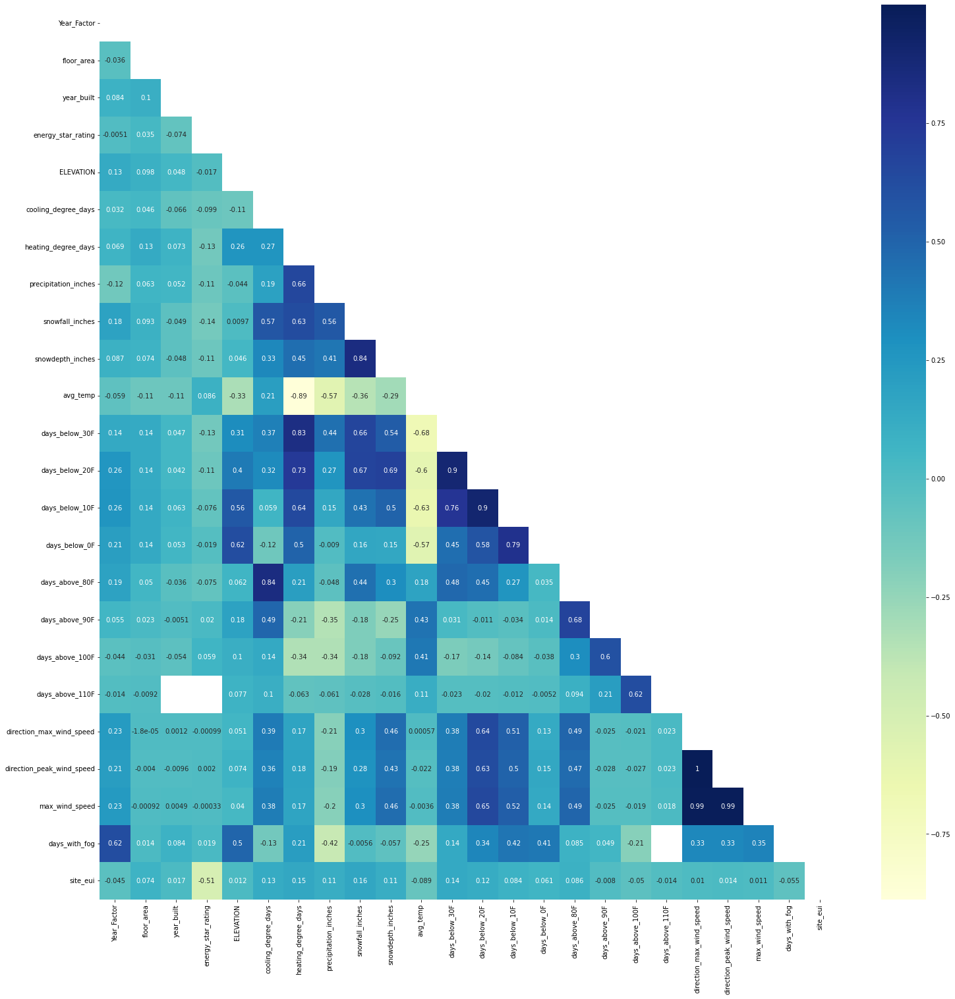

In [31]:
df = wids_train[['Year_Factor', 'State_Factor', 'floor_area', 'year_built', 
                 'energy_star_rating', 'ELEVATION','cooling_degree_days', 
                 'heating_degree_days', 'precipitation_inches', 'snowfall_inches',
       'snowdepth_inches', 'avg_temp', 'days_below_30F', 'days_below_20F',
       'days_below_10F', 'days_below_0F', 'days_above_80F', 'days_above_90F',
       'days_above_100F', 'days_above_110F', 'direction_max_wind_speed',
       'direction_peak_wind_speed', 'max_wind_speed', 'days_with_fog',
       'site_eui']]


plt.figure(figsize = (25,25))
mask = np.triu(np.ones_like(df.corr(), dtype=bool))
sns.heatmap(df.corr(), mask = mask, cmap="YlGnBu", annot=True)

Some times the very high Site eui numbers do not make sense to me when it comes to correlation. I am trying to split the eui below and above 200 just to check if removing the high eui's will make our correlation matrix any stronger or not.

After doing so, i found that the lower site eui (less than 200 in this case) have a little stronger correlation matrix especially with the heating degree days and cooling degree days as compared to taking correlations using all of site eui data. I did this just out of curiosity. 

<AxesSubplot:>

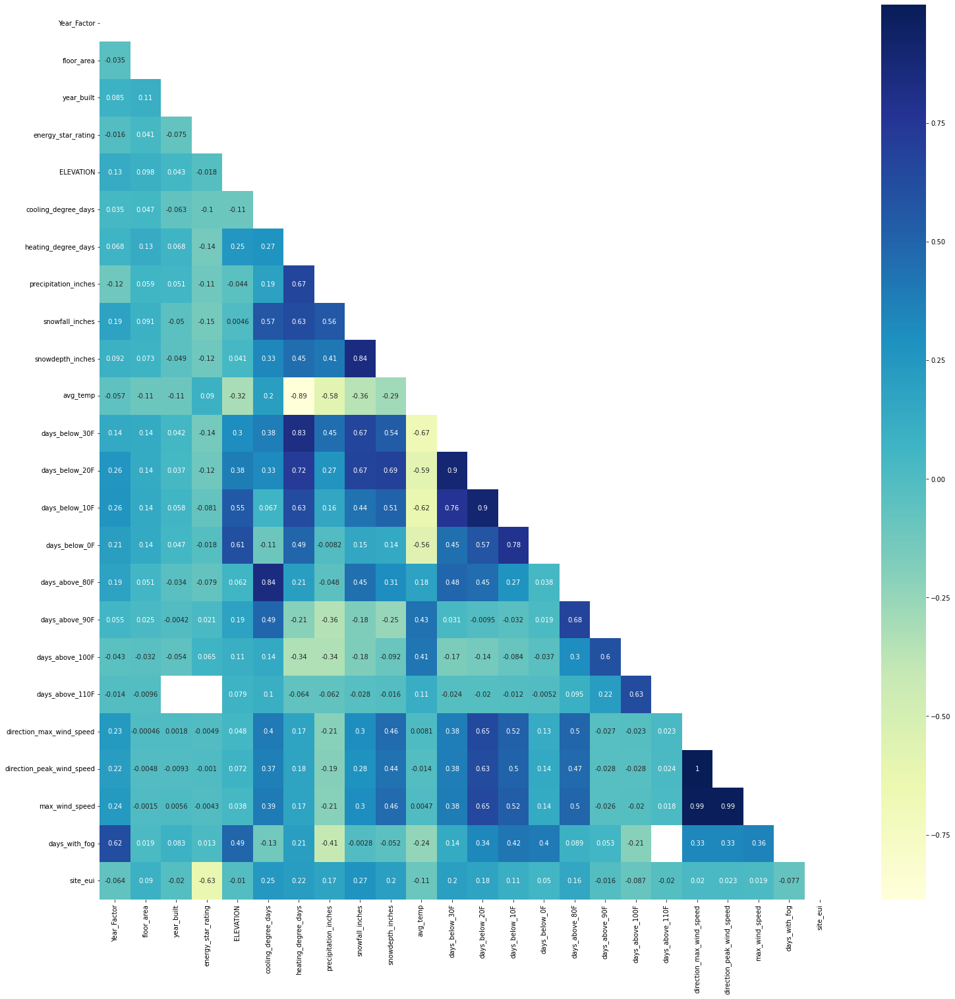

In [32]:
# let's just see the correlation matrix for buildings with high and low site eui.

df_low = df[df['site_eui'] <= 200]
plt.figure(figsize = (25,25))
mask = np.triu(np.ones_like(df_low.corr(), dtype=bool))
sns.heatmap(df_low.corr(), mask = mask, cmap="YlGnBu", annot=True)

The below correlation matrix is just for the data where site eui is more than 100.

<AxesSubplot:>

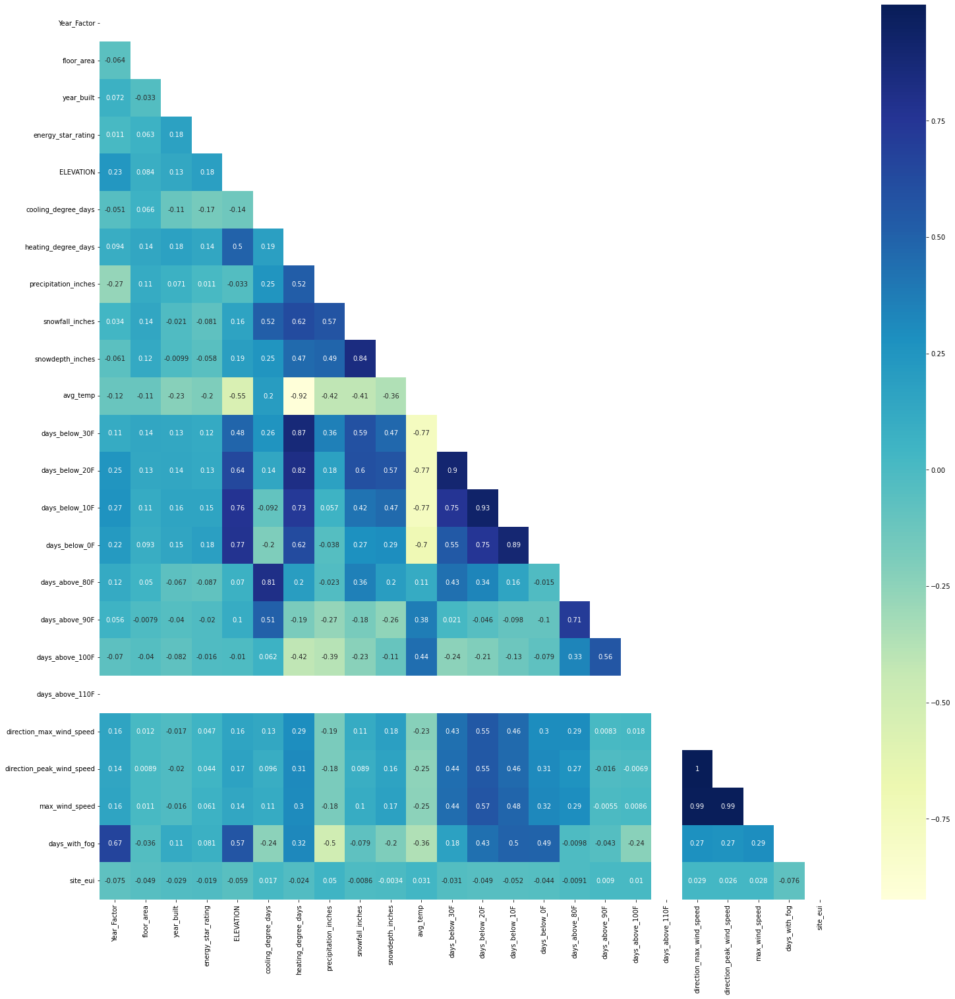

In [33]:
df_high = df[df['site_eui'] > 200]
plt.figure(figsize = (25,25))
mask = np.triu(np.ones_like(df_high.corr(), dtype=bool))
sns.heatmap(df_high.corr(), mask = mask, cmap="YlGnBu", annot=True)